In [2]:
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import numpy as np
import re

In [3]:
# Create function to find null values
def find_null_values(df):
    for column in df.columns:
        if df[column].isnull().sum() > 0:
            print(f'Column {column} has {df[column].isnull().sum()} null values')

In [4]:
# Create function to remove state abbreviation after city name
def remove_state_abbv(df):
    df['RegionName'] = [re.sub("(.*),.*", "\\1", str(x)) for x in df['RegionName']]

## Home Value Forecast Data


In [5]:
file_path1 = '../Resources/Zillow_HVF.csv'
hvf_df = pd.read_csv(file_path1, skiprows=[1])
hvf_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,BaseDate,2022-07-31,2022-09-30,2023-06-30
0,394913,1,"New York, NY",Msa,NY,2022-06-30,0.8,2.2,4.8
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,2022-06-30,0.0,1.0,5.3
2,394463,3,"Chicago, IL",Msa,IL,2022-06-30,0.9,2.6,5.1
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,2022-06-30,1.3,4.1,10.8
4,394974,5,"Philadelphia, PA",Msa,PA,2022-06-30,1.0,2.6,6.2


In [6]:
hvf_df.dtypes

RegionID        int64
SizeRank        int64
RegionName     object
RegionType     object
StateName      object
BaseDate       object
2022-07-31    float64
2022-09-30    float64
2023-06-30    float64
dtype: object

In [7]:
hvf_df.describe()

,RegionID,SizeRank,2022-07-31,2022-09-30,2023-06-30
count,911.000000,911.000000,906.000000,908.000000,911.000000
mean,415271.058178,459.346872,1.073620,3.110573,7.164874
std,83362.123219,267.460151,0.556726,1.113354,2.718895
min,394297.000000,1.000000,-1.400000,-1.800000,-6.400000
25%,394547.500000,228.500000,0.800000,2.400000,5.400000
50%,394803.000000,456.000000,1.100000,3.000000,6.900000
75%,395050.500000,687.500000,1.400000,3.800000,8.800000
max,753929.000000,933.000000,4.500000,10.200000,16.700000


In [8]:
# Remove state abbreviation after city name
remove_state_abbv(hvf_df)
hvf_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,BaseDate,2022-07-31,2022-09-30,2023-06-30
0,394913,1,New York,Msa,NY,2022-06-30,0.8,2.2,4.8
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,2022-06-30,0.0,1.0,5.3
2,394463,3,Chicago,Msa,IL,2022-06-30,0.9,2.6,5.1
3,394514,4,Dallas-Fort Worth,Msa,TX,2022-06-30,1.3,4.1,10.8
4,394974,5,Philadelphia,Msa,PA,2022-06-30,1.0,2.6,6.2


In [9]:
find_null_values(hvf_df)

Column 2022-07-31 has 5 null values
Column 2022-09-30 has 3 null values


In [10]:
hvf_df.dropna().reset_index(drop=True)
hvf_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,BaseDate,2022-07-31,2022-09-30,2023-06-30
0,394913,1,New York,Msa,NY,2022-06-30,0.8,2.2,4.8
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,2022-06-30,0.0,1.0,5.3
2,394463,3,Chicago,Msa,IL,2022-06-30,0.9,2.6,5.1
3,394514,4,Dallas-Fort Worth,Msa,TX,2022-06-30,1.3,4.1,10.8
4,394974,5,Philadelphia,Msa,PA,2022-06-30,1.0,2.6,6.2


In [11]:
# Drop Columns to clean up dataframe
hvf_data = hvf_df.drop(columns=['RegionID', 'SizeRank', 'RegionType', 'BaseDate'])
hvf_data.head()

,RegionName,StateName,2022-07-31,2022-09-30,2023-06-30
0,New York,NY,0.8,2.2,4.8
1,Los Angeles-Long Beach-Anaheim,CA,0.0,1.0,5.3
2,Chicago,IL,0.9,2.6,5.1
3,Dallas-Fort Worth,TX,1.3,4.1,10.8
4,Philadelphia,PA,1.0,2.6,6.2


## Home Value Index Data


In [12]:
file_path2 = '../Resources/Zillow_HVI.csv'
hvi_df = pd.read_csv(file_path2, skiprows=[1])
hvi_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,"New York, NY",Msa,NY,225516.0,226863.0,228076.0,230462.0,232684.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,231193.0,231998.0,233231.0,235575.0,238089.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,"Chicago, IL",Msa,IL,171271.0,171675.0,172198.0,173245.0,174354.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,131555.0,131660.0,131748.0,131961.0,132186.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,"Philadelphia, PA",Msa,PA,130664.0,131102.0,131365.0,132019.0,132548.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [13]:
hvi_df.describe()

,RegionID,SizeRank,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,2000-06-30,2000-07-31,2000-08-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
count,907.000000,907.000000,441.000000,442.000000,443.000000,445.000000,447.000000,448.000000,449.000000,450.000000,...,9.050000e+02,9.030000e+02,9.050000e+02,9.000000e+02,9.040000e+02,9.040000e+02,9.050000e+02,9.070000e+02,9.070000e+02,9.070000e+02
mean,415362.621830,458.314223,111778.011338,112093.617647,112331.101580,113175.939326,114006.814318,114535.830357,115242.314031,115922.871111,...,2.352768e+05,2.383079e+05,2.409995e+05,2.443872e+05,2.486014e+05,2.528947e+05,2.561354e+05,2.595221e+05,2.624475e+05,2.654158e+05
std,83534.501875,267.468546,53431.111974,53609.993189,53867.527434,54778.562436,55545.817953,56324.784252,57081.485879,57925.516627,...,1.586404e+05,1.613494e+05,1.635983e+05,1.664305e+05,1.691907e+05,1.724755e+05,1.760918e+05,1.797084e+05,1.826319e+05,1.842372e+05
min,394297.000000,1.000000,34637.000000,34540.000000,34582.000000,34548.000000,34685.000000,34784.000000,34899.000000,34965.000000,...,3.163800e+04,3.171700e+04,3.167000e+04,3.225600e+04,3.296500e+04,3.399400e+04,3.447800e+04,3.490800e+04,3.507500e+04,3.540200e+04
25%,394549.500000,227.500000,76892.000000,77166.500000,77393.000000,77814.000000,78188.500000,78469.000000,78814.000000,79088.250000,...,1.405830e+05,1.414260e+05,1.425110e+05,1.440908e+05,1.470575e+05,1.497798e+05,1.508700e+05,1.526525e+05,1.543845e+05,1.563580e+05
50%,394805.000000,454.000000,99932.000000,100481.500000,100350.000000,100898.000000,101454.000000,101819.000000,102328.000000,103034.000000,...,1.865140e+05,1.873400e+05,1.895890e+05,1.920675e+05,1.950420e+05,1.977215e+05,1.997510e+05,2.017630e+05,2.048510e+05,2.077100e+05
75%,395052.000000,686.500000,130664.000000,130645.750000,130591.000000,131259.000000,131808.500000,132394.000000,133053.000000,133386.250000,...,2.826970e+05,2.854000e+05,2.876470e+05,2.907185e+05,2.942508e+05,3.011140e+05,3.041230e+05,3.065625e+05,3.089795e+05,3.131065e+05
max,753929.000000,933.000000,434391.000000,436998.000000,440726.000000,451363.000000,461553.000000,473641.000000,482975.000000,495355.000000,...,1.495619e+06,1.504507e+06,1.519156e+06,1.539982e+06,1.568421e+06,1.606876e+06,1.646124e+06,1.682233e+06,1.692646e+06,1.679555e+06


In [14]:
# find null values
find_null_values(hvi_df)

Column 2000-01-31 has 466 null values
Column 2000-02-29 has 465 null values
Column 2000-03-31 has 464 null values
Column 2000-04-30 has 462 null values
Column 2000-05-31 has 460 null values
Column 2000-06-30 has 459 null values
Column 2000-07-31 has 458 null values
Column 2000-08-31 has 457 null values
Column 2000-09-30 has 456 null values
Column 2000-10-31 has 456 null values
Column 2000-11-30 has 453 null values
Column 2000-12-31 has 452 null values
Column 2001-01-31 has 444 null values
Column 2001-02-28 has 444 null values
Column 2001-03-31 has 444 null values
Column 2001-04-30 has 442 null values
Column 2001-05-31 has 441 null values
Column 2001-06-30 has 440 null values
Column 2001-07-31 has 439 null values
Column 2001-08-31 has 439 null values
Column 2001-09-30 has 439 null values
Column 2001-10-31 has 438 null values
Column 2001-11-30 has 437 null values
Column 2001-12-31 has 436 null values
Column 2002-01-31 has 435 null values
Column 2002-02-28 has 435 null values
Column 2002-

In [15]:
# Remove state abbreviation after city name
remove_state_abbv(hvi_df)

In [16]:
hvi_df.head(10)

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,225516.0,226863.0,228076.0,230462.0,232684.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,231193.0,231998.0,233231.0,235575.0,238089.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,Chicago,Msa,IL,171271.0,171675.0,172198.0,173245.0,174354.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,Dallas-Fort Worth,Msa,TX,131555.0,131660.0,131748.0,131961.0,132186.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,Philadelphia,Msa,PA,130664.0,131102.0,131365.0,132019.0,132548.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0
5,394692,6,Houston,Msa,TX,126519.0,126597.0,126478.0,126596.0,126604.0,...,270390.0,274697.0,277870.0,281297.0,284760.0,289080.0,294445.0,300457.0,306044.0,310239.0
6,395209,7,Washington,Msa,DC,193180.0,193427.0,193806.0,194612.0,195732.0,...,520427.0,523310.0,526230.0,529647.0,533439.0,538507.0,544142.0,549575.0,553983.0,556296.0
7,394856,8,Miami-Fort Lauderdale,Msa,FL,125671.0,126134.0,126548.0,127364.0,128034.0,...,371434.0,379642.0,387320.0,394586.0,402632.0,410239.0,420478.0,431182.0,444697.0,456489.0
8,394347,9,Atlanta,Msa,GA,154331.0,154844.0,155373.0,156442.0,157487.0,...,316952.0,324392.0,331958.0,339799.0,347293.0,354110.0,361285.0,368733.0,375982.0,381361.0
9,394404,10,Boston,Msa,MA,234051.0,235356.0,236623.0,238847.0,241059.0,...,604952.0,609550.0,613899.0,618764.0,624260.0,631495.0,639975.0,649831.0,657835.0,663494.0


In [17]:
# Get column dates from last two years only
hvi_new = hvi_df[hvi_df.columns[np.concatenate([range(0,5),range(222,275)])]]
hvi_new

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,460564.0,463521.0,466559.0,468942.0,470602.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,645528.0,650554.0,655102.0,657653.0,660519.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,Chicago,Msa,IL,235641.0,236447.0,236934.0,237390.0,237826.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,Dallas-Fort Worth,Msa,TX,239537.0,241512.0,243066.0,244240.0,245376.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,Philadelphia,Msa,PA,235521.0,236999.0,238512.0,239499.0,240009.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,394767,929,Lamesa,Msa,TX,69369.0,69990.0,70391.0,70759.0,71034.0,...,90901.0,91860.0,92441.0,94055.0,95700.0,97936.0,99128.0,100176.0,101259.0,102796.0
903,753874,930,Craig,Msa,CO,208440.0,208619.0,208181.0,207425.0,205875.0,...,240977.0,243967.0,245587.0,249005.0,251980.0,254360.0,254611.0,254762.0,255699.0,259578.0
904,394968,931,Pecos,Msa,TX,NaN,NaN,NaN,NaN,NaN,...,165382.0,170185.0,171244.0,174065.0,176831.0,179332.0,181149.0,183894.0,186876.0,190000.0
905,395188,932,Vernon,Msa,TX,70489.0,70826.0,71041.0,71194.0,71379.0,...,79200.0,79551.0,79838.0,81980.0,84202.0,86827.0,87516.0,88168.0,88454.0,89621.0


In [18]:
# Drop columns to clean up dataframe
hvi_data = hvi_new.drop(columns=['RegionID', 'SizeRank', 'RegionType']).reset_index(drop=True)
hvi_data.head()

,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,460564.0,463521.0,466559.0,468942.0,470602.0,471314.0,472019.0,473203.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,Los Angeles-Long Beach-Anaheim,CA,645528.0,650554.0,655102.0,657653.0,660519.0,660951.0,661828.0,662278.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,Chicago,IL,235641.0,236447.0,236934.0,237390.0,237826.0,238240.0,238541.0,239193.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,Dallas-Fort Worth,TX,239537.0,241512.0,243066.0,244240.0,245376.0,246368.0,247592.0,248615.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,Philadelphia,PA,235521.0,236999.0,238512.0,239499.0,240009.0,240483.0,241019.0,241819.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [19]:
hvi_data = hvi_data.dropna().reset_index(drop=True)
hvi_data.head()

,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,460564.0,463521.0,466559.0,468942.0,470602.0,471314.0,472019.0,473203.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,Los Angeles-Long Beach-Anaheim,CA,645528.0,650554.0,655102.0,657653.0,660519.0,660951.0,661828.0,662278.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,Chicago,IL,235641.0,236447.0,236934.0,237390.0,237826.0,238240.0,238541.0,239193.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,Dallas-Fort Worth,TX,239537.0,241512.0,243066.0,244240.0,245376.0,246368.0,247592.0,248615.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,Philadelphia,PA,235521.0,236999.0,238512.0,239499.0,240009.0,240483.0,241019.0,241819.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [20]:
# add date column labels to list to use in fixing rent dataframe column labels
labels = (hvi_data.columns[2:].values.tolist())
print(labels)

['2018-02-28', '2018-03-31', '2018-04-30', '2018-05-31', '2018-06-30', '2018-07-31', '2018-08-31', '2018-09-30', '2018-10-31', '2018-11-30', '2018-12-31', '2019-01-31', '2019-02-28', '2019-03-31', '2019-04-30', '2019-05-31', '2019-06-30', '2019-07-31', '2019-08-31', '2019-09-30', '2019-10-31', '2019-11-30', '2019-12-31', '2020-01-31', '2020-02-29', '2020-03-31', '2020-04-30', '2020-05-31', '2020-06-30', '2020-07-31', '2020-08-31', '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30', '2022-05-31', '2022-06-30']


In [21]:
# Reorder data to have all the dates in one column
hvi_by_month = hvi_data.melt(id_vars=['RegionName', 'StateName'],
                                          var_name='Date',
                                          value_name='HVI')
hvi_by_month.head()

,RegionName,StateName,Date,HVI
0,New York,NY,2018-02-28,460564.0
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,645528.0
2,Chicago,IL,2018-02-28,235641.0
3,Dallas-Fort Worth,TX,2018-02-28,239537.0
4,Philadelphia,PA,2018-02-28,235521.0


In [22]:
# Rename RegionName and StateName columns
hvi_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
hvi_by_month.head()

,City,State,Date,HVI
0,New York,NY,2018-02-28,460564.0
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,645528.0
2,Chicago,IL,2018-02-28,235641.0
3,Dallas-Fort Worth,TX,2018-02-28,239537.0
4,Philadelphia,PA,2018-02-28,235521.0


In [23]:
# Reorder DataFrames so Date column is first
hvi_by_month = hvi_by_month[['Date', 'City', 'State', 'HVI']]
hvi_by_month.head()

,Date,City,State,HVI
0,2018-02-28,New York,NY,460564.0
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,645528.0
2,2018-02-28,Chicago,IL,235641.0
3,2018-02-28,Dallas-Fort Worth,TX,239537.0
4,2018-02-28,Philadelphia,PA,235521.0


In [24]:
# Get the monthly percentage of change for HVI for each city
hvi_by_month['%Change_HVI'] = hvi_by_month.groupby(['City', 'State'])['HVI'].pct_change().mul(100).round(2)
hvi_by_month

,Date,City,State,HVI,%Change_HVI
0,2018-02-28,New York,NY,460564.0,NaN
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,645528.0,NaN
2,2018-02-28,Chicago,IL,235641.0,NaN
3,2018-02-28,Dallas-Fort Worth,TX,239537.0,NaN
4,2018-02-28,Philadelphia,PA,235521.0,NaN
...,...,...,...,...,...
30205,2022-06-30,Sweetwater,TX,94790.0,1.15
30206,2022-06-30,Andrews,TX,221347.0,1.44
30207,2022-06-30,Zapata,TX,117079.0,0.85
30208,2022-06-30,Vermillion,SD,231123.0,1.12


In [25]:
hvi_data = hvi_by_month.dropna().reset_index(drop=True)
hvi_data

,Date,City,State,HVI,%Change_HVI
0,2018-03-31,New York,NY,463521.0,0.64
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,650554.0,0.78
2,2018-03-31,Chicago,IL,236447.0,0.34
3,2018-03-31,Dallas-Fort Worth,TX,241512.0,0.82
4,2018-03-31,Philadelphia,PA,236999.0,0.63
...,...,...,...,...,...
29635,2022-06-30,Sweetwater,TX,94790.0,1.15
29636,2022-06-30,Andrews,TX,221347.0,1.44
29637,2022-06-30,Zapata,TX,117079.0,0.85
29638,2022-06-30,Vermillion,SD,231123.0,1.12


In [26]:
hvi_data['State'].unique()

array(['NY', 'CA', 'IL', 'TX', 'PA', 'DC', 'FL', 'GA', 'MA', 'MI', 'AZ',
       'WA', 'MN', 'MO', 'MD', 'CO', 'OR', 'NC', 'OH', 'NV', 'IN', 'VA',
       'TN', 'RI', 'WI', 'OK', 'KY', 'CT', 'LA', 'AL', 'UT', 'HI', 'NM',
       'NE', 'SC', 'AR', 'KS', 'ID', 'IA', 'MS', 'ME', 'NH', 'DE', 'NJ',
       'WV', 'SD', 'VT', 'ND', 'MT', 'AK', 'WY'], dtype=object)

In [27]:
#output_path = 'Resources/hvi_data.csv'
#hvi_data.to_csv(output_path, index=False)

## Rent Index Data


In [28]:
file_path3 = '../Resources/Zillow_Rent_Index.csv'
rent_df = pd.read_csv(file_path3, skiprows=[1])
rent_df.head()

,RegionID,RegionName,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,394913,"New York, NY",1,2306.0,2335,2342.0,2348,2382,2400,2418,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,753899,"Los Angeles-Long Beach-Anaheim, CA",2,1815.0,1846,1833.0,1842,1865,1885,1903,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,394463,"Chicago, IL",3,1464.0,1477,1478.0,1483,1499,1514,1522,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,394514,"Dallas-Fort Worth, TX",4,1105.0,1130,1136.0,1152,1147,1150,1155,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,394974,"Philadelphia, PA",5,1350.0,1316,1337.0,1340,1349,1360,1365,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [29]:
# Split RegionName column into City and State Columns and drop RegionName
rent_df.dropna(inplace=True)
new = rent_df['RegionName'].str.split(', ', n=1, expand=True)
rent_df['City'] = new[0]
rent_df['State'] = new[1]
rent_df.drop(columns=['RegionName'], inplace=True)

rent_df

,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,...,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06,City,State
0,394913,1,2306.0,2335,2342.0,2348,2382,2400,2418,2426,...,2852,2884,2917,2970,3019,3072,3135,3186,New York,NY
1,753899,2,1815.0,1846,1833.0,1842,1865,1885,1903,1918,...,2759,2781,2801,2834,2863,2900,2935,2951,Los Angeles-Long Beach-Anaheim,CA
2,394463,3,1464.0,1477,1478.0,1483,1499,1514,1522,1525,...,1818,1832,1846,1860,1883,1907,1931,1947,Chicago,IL
3,394514,4,1105.0,1130,1136.0,1152,1147,1150,1155,1157,...,1700,1710,1719,1735,1744,1771,1802,1825,Dallas-Fort Worth,TX
4,394974,5,1350.0,1316,1337.0,1340,1349,1360,1365,1370,...,1766,1788,1784,1794,1808,1821,1838,1852,Philadelphia,PA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,394602,159,1237.0,1270,1260.0,1267,1273,1275,1285,1281,...,1757,1776,1773,1797,1811,1825,1855,1874,Fort Collins,CO
104,394405,162,1456.0,1489,1456.0,1443,1457,1492,1505,1514,...,2080,2104,2131,2147,2185,2206,2219,2221,Boulder,CO
105,394483,192,984.0,1026,1005.0,1017,1021,1031,1034,1038,...,1296,1310,1318,1333,1346,1353,1354,1356,College Station,TX
106,394623,229,883.0,922,936.0,928,930,934,926,933,...,1561,1583,1600,1605,1615,1606,1627,1652,Gainesville,GA


In [30]:
rent_df.dtypes

RegionID      int64
SizeRank      int64
2014-01     float64
2014-02       int64
2014-03     float64
             ...   
2022-04       int64
2022-05       int64
2022-06       int64
City         object
State        object
Length: 106, dtype: object

In [31]:
rent_df['State'].unique()

array(['NY', 'CA', 'IL', 'TX', 'PA', 'DC', 'FL', 'GA', 'MA', 'MI', 'AZ',
       'WA', 'MN', 'MO', 'MD', 'CO', 'OR', 'NC', 'OH', 'NV', 'IN', 'VA',
       'TN', 'RI', 'OK', 'KY', 'CT', 'LA', 'AL', 'UT', 'HI', 'NM', 'NE',
       'SC', 'AR', 'ID', 'WI', 'IA', 'MS'], dtype=object)

In [32]:
# Grab State Column to move to first column
col1 = rent_df.pop('State')

# Insert col1 into first position
rent_df.insert(0, 'State', col1)


# Grab City column and move to first column
col2 = rent_df.pop('City')
rent_df.insert(0, 'City', col2)
rent_df

,City,State,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,394913,1,2306.0,2335,2342.0,2348,2382,2400,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,753899,2,1815.0,1846,1833.0,1842,1865,1885,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,394463,3,1464.0,1477,1478.0,1483,1499,1514,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,394514,4,1105.0,1130,1136.0,1152,1147,1150,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,394974,5,1350.0,1316,1337.0,1340,1349,1360,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,Fort Collins,CO,394602,159,1237.0,1270,1260.0,1267,1273,1275,...,1732,1757,1757,1776,1773,1797,1811,1825,1855,1874
104,Boulder,CO,394405,162,1456.0,1489,1456.0,1443,1457,1492,...,2067,2073,2080,2104,2131,2147,2185,2206,2219,2221
105,College Station,TX,394483,192,984.0,1026,1005.0,1017,1021,1031,...,1237,1256,1296,1310,1318,1333,1346,1353,1354,1356
106,Gainesville,GA,394623,229,883.0,922,936.0,928,930,934,...,1533,1532,1561,1583,1600,1605,1615,1606,1627,1652


In [33]:
rent_df.describe()

,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000,...,100.00000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,100.000000,100.000000
mean,405538.990000,60.300000,1124.970000,1134.600000,1134.920000,1139.59000,1149.560000,1158.050000,1165.590000,1168.200000,...,1653.21000,1665.620000,1680.020000,1692.390000,1694.760000,1711.47000,1730.770000,1751.540000,1774.690000,1788.120000
std,61574.838161,47.924288,313.595199,314.163054,315.384571,317.03322,324.015348,330.276602,333.100801,336.990513,...,445.97464,451.296489,455.254574,460.504333,466.287273,468.29041,473.858839,481.700553,489.623494,491.664978
min,394304.000000,1.000000,673.000000,696.000000,672.000000,678.00000,692.000000,681.000000,666.000000,676.000000,...,911.00000,920.000000,931.000000,958.000000,970.000000,965.00000,967.000000,960.000000,952.000000,960.000000
25%,394508.500000,25.750000,941.750000,951.500000,955.750000,954.00000,960.000000,960.000000,969.500000,970.750000,...,1317.50000,1323.000000,1318.500000,1330.000000,1333.750000,1347.75000,1359.000000,1378.000000,1394.250000,1401.250000
50%,394786.500000,55.500000,1030.500000,1034.500000,1038.000000,1036.00000,1039.000000,1051.500000,1060.500000,1067.500000,...,1567.50000,1584.000000,1585.500000,1598.500000,1600.000000,1617.00000,1634.500000,1661.500000,1684.500000,1704.000000
75%,395030.000000,83.250000,1166.500000,1189.250000,1185.000000,1190.00000,1209.250000,1213.250000,1222.250000,1229.750000,...,1811.75000,1820.500000,1830.750000,1841.250000,1847.500000,1860.25000,1886.750000,1909.250000,1940.250000,1948.500000
max,753924.000000,309.000000,2306.000000,2335.000000,2342.000000,2348.00000,2382.000000,2400.000000,2418.000000,2426.000000,...,3099.00000,3110.000000,3107.000000,3129.000000,3137.000000,3158.00000,3192.000000,3215.000000,3247.000000,3266.000000


In [34]:
# find null values
find_null_values(rent_df)

In [35]:
# Select date columns from the last two years
rent_new = rent_df[rent_df.columns[np.concatenate([range(0,4),range(53,106)])]]
rent_new

,City,State,RegionID,SizeRank,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,394913,1,2611,2621,2635,2650,2664,2678,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,753899,2,2312,2320,2332,2343,2356,2365,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,394463,3,1636,1649,1659,1671,1681,1684,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,394514,4,1337,1340,1348,1352,1361,1366,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,394974,5,1478,1489,1499,1510,1514,1515,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,Fort Collins,CO,394602,159,1454,1481,1494,1509,1511,1512,...,1732,1757,1757,1776,1773,1797,1811,1825,1855,1874
104,Boulder,CO,394405,162,1749,1757,1755,1776,1802,1817,...,2067,2073,2080,2104,2131,2147,2185,2206,2219,2221
105,College Station,TX,394483,192,1164,1160,1155,1150,1145,1134,...,1237,1256,1296,1310,1318,1333,1346,1353,1354,1356
106,Gainesville,GA,394623,229,1123,1129,1138,1134,1135,1143,...,1533,1532,1561,1583,1600,1605,1615,1606,1627,1652


In [36]:
# Drop Columns to clean up dataframe
rent_data = rent_new.drop(columns=['RegionID', 'SizeRank']).reset_index(drop=True)
rent_data.head()

,City,State,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,2611,2621,2635,2650,2664,2678,2684,2683,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,2312,2320,2332,2343,2356,2365,2377,2382,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,1636,1649,1659,1671,1681,1684,1681,1674,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,1337,1340,1348,1352,1361,1366,1370,1366,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,1478,1489,1499,1510,1514,1515,1517,1518,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [37]:
# Rename date columns to match format from other dataframes
rent_data.columns.values[2:] = labels
rent_data.head()

,City,State,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,2611,2621,2635,2650,2664,2678,2684,2683,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,2312,2320,2332,2343,2356,2365,2377,2382,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,1636,1649,1659,1671,1681,1684,1681,1674,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,1337,1340,1348,1352,1361,1366,1370,1366,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,1478,1489,1499,1510,1514,1515,1517,1518,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [38]:
# Reorder dataframe to have dates in one column
rent_data_by_month = rent_data.melt(id_vars=['City', 'State'],
                                          var_name='Date',
                                          value_name='Avg_Rent')
rent_data_by_month

,City,State,Date,Avg_Rent
0,New York,NY,2018-02-28,2611
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,2312
2,Chicago,IL,2018-02-28,1636
3,Dallas-Fort Worth,TX,2018-02-28,1337
4,Philadelphia,PA,2018-02-28,1478
...,...,...,...,...
5295,Fort Collins,CO,2022-06-30,1874
5296,Boulder,CO,2022-06-30,2221
5297,College Station,TX,2022-06-30,1356
5298,Gainesville,GA,2022-06-30,1652


In [39]:
# Reorder columns to move Date to first
rent_data_by_month = rent_data_by_month[['Date', 'City', 'State', 'Avg_Rent']]
rent_data_by_month.head()

,Date,City,State,Avg_Rent
0,2018-02-28,New York,NY,2611
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2312
2,2018-02-28,Chicago,IL,1636
3,2018-02-28,Dallas-Fort Worth,TX,1337
4,2018-02-28,Philadelphia,PA,1478


In [40]:
rent_change = rent_data_by_month.groupby(['City', 'State'])['Avg_Rent'].pct_change().mul(100).round(2)
rent_change

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
5295    1.02
5296    0.09
5297    0.15
5298    1.54
5299   -4.33
Name: Avg_Rent, Length: 5300, dtype: float64

In [41]:
rent_data_by_month['%Change_Rent'] = rent_change
rent_data_by_month.head()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Date,City,State,Avg_Rent,%Change_Rent
0,2018-02-28,New York,NY,2611,NaN
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2312,NaN
2,2018-02-28,Chicago,IL,1636,NaN
3,2018-02-28,Dallas-Fort Worth,TX,1337,NaN
4,2018-02-28,Philadelphia,PA,1478,NaN


In [42]:
# Get the monthly percentage of change for Rent for each city
#rent_data_by_month['%Change_Rent'] = rent_data_by_month.groupby(['City', 'State'])['Avg_Rent'].pct_change().mul(100).round(2)
rent_data = rent_data_by_month.dropna().reset_index(drop=True)
rent_data.head()

,Date,City,State,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,2621,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2320,0.35
2,2018-03-31,Chicago,IL,1649,0.79
3,2018-03-31,Dallas-Fort Worth,TX,1340,0.22
4,2018-03-31,Philadelphia,PA,1489,0.74


In [43]:
#output_path = 'Resources/rent_data.csv'
#rent_data.to_csv(output_path, index=False)


## List Price Data

In [44]:
file_path4 = '../Resources/Zillow_Med_List_Price.csv'
list_Price_df = pd.read_csv(file_path4, skiprows=[1])
list_Price_df

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,"New York, NY",Msa,NY,517967.0,523000.0,534333.0,544667.0,554667.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,798670.0,804333.0,821000.0,838000.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,"Chicago, IL",Msa,IL,301333.0,305967.0,319467.0,336133.0,346133.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,341634.0,345000.0,351633.0,359633.0,365967.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,"Philadelphia, PA",Msa,PA,252633.0,249633.0,253667.0,260633.0,270133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,394528,90,"Daytona Beach, FL",Msa,FL,269600.0,270267.0,271933.0,275250.0,280280.0,...,344966.0,351133.0,355047.0,355080.0,355247.0,362667.0,375833.0,389500.0,399800.0,409633.0
90,394531,91,"Des Moines, IA",Msa,IA,273284.0,277651.0,283797.0,288616.0,290719.0,...,319367.0,316487.0,317439.0,320773.0,327351.0,336995.0,347962.0,356798.0,357468.0,358835.0
91,395006,100,"Provo, UT",Msa,UT,384442.0,392308.0,402985.0,408117.0,404294.0,...,552313.0,552280.0,552280.0,563627.0,586960.0,622963.0,659967.0,686667.0,684967.0,669300.0
92,394549,104,"Durham, NC",Msa,NC,359817.0,363902.0,372943.0,382014.0,386264.0,...,471633.0,474967.0,475000.0,472253.0,471253.0,479553.0,502300.0,523300.0,531667.0,520000.0


In [45]:
# Remove state abbreviation after city name
remove_state_abbv(list_Price_df)
list_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,517967.0,523000.0,534333.0,544667.0,554667.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,798670.0,804333.0,821000.0,838000.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,Chicago,Msa,IL,301333.0,305967.0,319467.0,336133.0,346133.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,Dallas-Fort Worth,Msa,TX,341634.0,345000.0,351633.0,359633.0,365967.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,Philadelphia,Msa,PA,252633.0,249633.0,253667.0,260633.0,270133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0


In [46]:
# Select date columns from the last two years
new_list_Price_df = list_Price_df[list_Price_df.columns[np.concatenate([range(0,5),range(6,59)])]]
new_list_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,523000.0,534333.0,544667.0,554667.0,560000.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,804333.0,821000.0,838000.0,849667.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,Chicago,Msa,IL,305967.0,319467.0,336133.0,346133.0,348600.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,Dallas-Fort Worth,Msa,TX,345000.0,351633.0,359633.0,365967.0,365667.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,Philadelphia,Msa,PA,249633.0,253667.0,260633.0,270133.0,276133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0


In [47]:
new_list_Price_df.describe()

,RegionID,SizeRank,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
count,94.000000,94.000000,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,...,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01
mean,406233.648936,48.393617,3.285606e+05,3.356524e+05,3.441128e+05,3.502603e+05,3.529974e+05,3.516355e+05,3.472510e+05,3.419413e+05,...,4.162018e+05,4.150432e+05,4.159659e+05,4.179370e+05,4.222294e+05,4.303954e+05,4.418656e+05,4.528603e+05,4.613316e+05,4.652176e+05
std,63466.030695,29.566844,1.688764e+05,1.735279e+05,1.778710e+05,1.796632e+05,1.796345e+05,1.760614e+05,1.700896e+05,1.642567e+05,...,1.871858e+05,1.867655e+05,1.865295e+05,1.864126e+05,1.891251e+05,1.959427e+05,2.051308e+05,2.117947e+05,2.151746e+05,2.148092e+05
min,394304.000000,1.000000,1.256000e+05,1.299670e+05,1.366330e+05,1.420830e+05,1.434900e+05,1.446450e+05,1.457990e+05,1.457670e+05,...,1.792670e+05,1.709330e+05,1.642670e+05,1.582330e+05,1.515670e+05,1.456000e+05,1.489670e+05,1.573000e+05,1.666000e+05,1.699330e+05
25%,394515.750000,24.250000,2.303372e+05,2.324020e+05,2.478568e+05,2.523032e+05,2.546225e+05,2.573485e+05,2.559575e+05,2.516075e+05,...,3.026960e+05,3.018915e+05,3.054972e+05,3.068198e+05,3.123008e+05,3.123920e+05,3.159042e+05,3.297548e+05,3.301418e+05,3.348830e+05
50%,394829.500000,47.500000,2.809105e+05,2.875585e+05,3.000735e+05,3.095630e+05,3.127645e+05,3.100640e+05,3.054185e+05,2.983805e+05,...,3.665635e+05,3.663700e+05,3.673635e+05,3.703655e+05,3.716385e+05,3.794185e+05,3.934190e+05,4.027515e+05,4.131830e+05,4.141165e+05
75%,395029.500000,70.750000,3.633330e+05,3.675278e+05,3.775460e+05,3.790425e+05,3.789370e+05,3.768942e+05,3.700110e+05,3.667275e+05,...,4.784060e+05,4.875702e+05,5.023782e+05,5.149815e+05,5.201748e+05,5.313228e+05,5.492350e+05,5.683460e+05,5.817828e+05,5.930325e+05
max,753924.000000,159.000000,1.111650e+06,1.156667e+06,1.208333e+06,1.245000e+06,1.261333e+06,1.244333e+06,1.199296e+06,1.149629e+06,...,1.283333e+06,1.276667e+06,1.255000e+06,1.228000e+06,1.236000e+06,1.282667e+06,1.359667e+06,1.409667e+06,1.455667e+06,1.462333e+06


In [48]:
# find null values
find_null_values(new_list_Price_df)

Column 2021-03-31 has 1 null values
Column 2021-04-30 has 2 null values
Column 2021-05-31 has 3 null values
Column 2021-06-30 has 2 null values
Column 2021-07-31 has 1 null values
Column 2021-08-31 has 1 null values


In [49]:
# Drop columns to clean up dataframe
list_price_data = new_list_Price_df.drop(columns=['RegionID', 'SizeRank', 'RegionType'])
list_price_data

,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,523000.0,534333.0,544667.0,554667.0,560000.0,561333.0,556296.0,551296.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,Los Angeles-Long Beach-Anaheim,CA,804333.0,821000.0,838000.0,849667.0,849667.0,841333.0,824333.0,803000.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,Chicago,IL,305967.0,319467.0,336133.0,346133.0,348600.0,344933.0,338267.0,330967.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,Dallas-Fort Worth,TX,345000.0,351633.0,359633.0,365967.0,365667.0,359300.0,350355.0,343988.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,Philadelphia,PA,249633.0,253667.0,260633.0,270133.0,276133.0,279467.0,278267.0,276433.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,Daytona Beach,FL,270267.0,271933.0,275250.0,280280.0,284980.0,288297.0,287600.0,284567.0,...,344966.0,351133.0,355047.0,355080.0,355247.0,362667.0,375833.0,389500.0,399800.0,409633.0
90,Des Moines,IA,277651.0,283797.0,288616.0,290719.0,291010.0,291010.0,288745.0,285511.0,...,319367.0,316487.0,317439.0,320773.0,327351.0,336995.0,347962.0,356798.0,357468.0,358835.0
91,Provo,UT,392308.0,402985.0,408117.0,404294.0,397371.0,393783.0,392998.0,391276.0,...,552313.0,552280.0,552280.0,563627.0,586960.0,622963.0,659967.0,686667.0,684967.0,669300.0
92,Durham,NC,363902.0,372943.0,382014.0,386264.0,383543.0,378915.0,370583.0,365745.0,...,471633.0,474967.0,475000.0,472253.0,471253.0,479553.0,502300.0,523300.0,531667.0,520000.0


In [50]:
# Fill NA values with mean of the row
clean_list_price_data = list_price_data.fillna(dict.fromkeys(list_price_data.columns[2:],
                                                            list_price_data.mean(axis=1))).dropna()                       

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [51]:
# Check that there are no more NA values
find_null_values(clean_list_price_data)

In [52]:
# Reorder data so dates are all in one column
list_price_by_month = clean_list_price_data.melt(id_vars=['RegionName', 'StateName'],
                                          var_name='Date',
                                          value_name='Avg_List_Price')
list_price_by_month

,RegionName,StateName,Date,Avg_List_Price
0,New York,NY,2018-02-28,523000.0
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,804333.0
2,Chicago,IL,2018-02-28,305967.0
3,Dallas-Fort Worth,TX,2018-02-28,345000.0
4,Philadelphia,PA,2018-02-28,249633.0
...,...,...,...,...
4977,Daytona Beach,FL,2022-06-30,409633.0
4978,Des Moines,IA,2022-06-30,358835.0
4979,Provo,UT,2022-06-30,669300.0
4980,Durham,NC,2022-06-30,520000.0


In [53]:
# Rename RegionName and StateName columns
list_price_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
list_price_by_month.head()

,City,State,Date,Avg_List_Price
0,New York,NY,2018-02-28,523000.0
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,804333.0
2,Chicago,IL,2018-02-28,305967.0
3,Dallas-Fort Worth,TX,2018-02-28,345000.0
4,Philadelphia,PA,2018-02-28,249633.0


In [54]:
# Move Date Column to the first column
list_price_by_month = list_price_by_month[['Date', 'City', 'State', 'Avg_List_Price']]
list_price_by_month.head()

,Date,City,State,Avg_List_Price
0,2018-02-28,New York,NY,523000.0
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,804333.0
2,2018-02-28,Chicago,IL,305967.0
3,2018-02-28,Dallas-Fort Worth,TX,345000.0
4,2018-02-28,Philadelphia,PA,249633.0


In [55]:
# Get the monthly percentage of change for List Price for each city
list_price_by_month['%Change_LP'] = list_price_by_month.groupby(['City', 'State'])['Avg_List_Price'].pct_change().mul(100).round(2)
list_price_data = list_price_by_month.dropna().reset_index(drop=True)
list_price_data

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Date,City,State,Avg_List_Price,%Change_LP
0,2018-03-31,New York,NY,534333.0,2.17
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,821000.0,2.07
2,2018-03-31,Chicago,IL,319467.0,4.41
3,2018-03-31,Dallas-Fort Worth,TX,351633.0,1.92
4,2018-03-31,Philadelphia,PA,253667.0,1.62
...,...,...,...,...,...
4883,2022-06-30,Daytona Beach,FL,409633.0,2.46
4884,2022-06-30,Des Moines,IA,358835.0,0.38
4885,2022-06-30,Provo,UT,669300.0,-2.29
4886,2022-06-30,Durham,NC,520000.0,-2.19


In [56]:
#output_path = 'Resources/list_price_data.csv'
#list_price_data.to_csv(output_path, index=False)

## Sale Price Data


In [57]:
file_path5 = '../Resources/Zillow_Med_Sale_Price.csv'
sale_Price_df = pd.read_csv(file_path5, skiprows=[1])
sale_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,"New York, NY",Msa,NY,411667.0,411631.0,413297.0,418297.0,422500.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,503333.0,496667.0,491667.0,483333.0,470000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,"Chicago, IL",Msa,IL,250780.0,252113.0,255447.0,258833.0,260833.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,149833.0,153200.0,155533.0,158333.0,158967.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,"Philadelphia, PA",Msa,PA,220581.0,224915.0,229333.0,237333.0,242333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [58]:
# Remove state abbreviation after city name
remove_state_abbv(sale_Price_df)
sale_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,New York,Msa,NY,411667.0,411631.0,413297.0,418297.0,422500.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,503333.0,496667.0,491667.0,483333.0,470000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,Chicago,Msa,IL,250780.0,252113.0,255447.0,258833.0,260833.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,Dallas-Fort Worth,Msa,TX,149833.0,153200.0,155533.0,158333.0,158967.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,Philadelphia,Msa,PA,220581.0,224915.0,229333.0,237333.0,242333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [59]:
# Select date columns from the last two years
sale_Price_new = sale_Price_df[sale_Price_df.columns[np.concatenate([range(0,5),range(123,175)])]]
sale_Price_new.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,New York,Msa,NY,400000.0,399667.0,400667.0,404269.0,412936.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,616000.0,622667.0,636000.0,644667.0,651667.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,Chicago,Msa,IL,221500.0,225667.0,232333.0,239333.0,244333.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,Dallas-Fort Worth,Msa,TX,253667.0,255667.0,261667.0,268333.0,273300.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,Philadelphia,Msa,PA,225667.0,224000.0,229000.0,236333.0,243300.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [60]:
sale_Price_new.describe()

,RegionID,SizeRank,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
count,94.000000,94.000000,94.000000,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,...,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01,9.400000e+01
mean,406233.648936,48.393617,257580.287234,2.590683e+05,2.643548e+05,2.700271e+05,2.752758e+05,2.781884e+05,2.783806e+05,2.748940e+05,...,3.593812e+05,3.583864e+05,3.573706e+05,3.573521e+05,3.592517e+05,3.588841e+05,3.609920e+05,3.671259e+05,3.800177e+05,3.929625e+05
std,63466.030695,29.566844,139078.816045,1.445847e+05,1.509323e+05,1.544954e+05,1.542130e+05,1.526037e+05,1.508869e+05,1.469853e+05,...,1.854585e+05,1.829549e+05,1.828920e+05,1.835171e+05,1.847872e+05,1.834693e+05,1.868411e+05,1.950537e+05,2.077940e+05,2.137800e+05
min,394304.000000,1.000000,106894.000000,1.084850e+05,1.138180e+05,1.209850e+05,1.254670e+05,1.306330e+05,1.298000e+05,1.315000e+05,...,1.550000e+05,1.545710e+05,1.512380e+05,1.485710e+05,1.476670e+05,1.443330e+05,1.462500e+05,1.469000e+05,1.520000e+05,1.581170e+05
25%,394515.750000,24.250000,175649.250000,1.762290e+05,1.773332e+05,1.825830e+05,1.876870e+05,1.921415e+05,1.937502e+05,1.930832e+05,...,2.487498e+05,2.445830e+05,2.417375e+05,2.408420e+05,2.401122e+05,2.423368e+05,2.428160e+05,2.448250e+05,2.519752e+05,2.548960e+05
50%,394829.500000,47.500000,223412.000000,2.249285e+05,2.304405e+05,2.345625e+05,2.373270e+05,2.395940e+05,2.418330e+05,2.376340e+05,...,3.068335e+05,3.067585e+05,3.039660e+05,3.015075e+05,3.056745e+05,3.083325e+05,3.144085e+05,3.202480e+05,3.294160e+05,3.371665e+05
75%,395029.500000,70.750000,271500.250000,2.707495e+05,2.753330e+05,2.787080e+05,2.822915e+05,2.860805e+05,2.866960e+05,2.820195e+05,...,4.018128e+05,4.070415e+05,4.132968e+05,4.146710e+05,4.171705e+05,4.193330e+05,4.265622e+05,4.400890e+05,4.568248e+05,4.702495e+05
max,753924.000000,159.000000,999333.000000,1.074333e+06,1.142667e+06,1.176667e+06,1.160000e+06,1.140833e+06,1.125833e+06,1.085833e+06,...,1.315667e+06,1.297333e+06,1.304167e+06,1.310000e+06,1.325167e+06,1.295167e+06,1.318500e+06,1.381667e+06,1.486667e+06,1.523333e+06


In [61]:
# find null values
find_null_values(sale_Price_new)

Column 2021-04-30 has 1 null values
Column 2021-06-30 has 1 null values


In [62]:
# Drop columns to clean up dataframe
sale_price_data = sale_Price_new.drop(columns=['RegionID', 'SizeRank', 'RegionType'])
sale_price_data.head()

,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,New York,NY,400000.0,399667.0,400667.0,404269.0,412936.0,423602.0,431667.0,431333.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,Los Angeles-Long Beach-Anaheim,CA,616000.0,622667.0,636000.0,644667.0,651667.0,655000.0,655000.0,650000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,Chicago,IL,221500.0,225667.0,232333.0,239333.0,244333.0,246500.0,244435.0,238435.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,Dallas-Fort Worth,TX,253667.0,255667.0,261667.0,268333.0,273300.0,275967.0,273333.0,266700.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,Philadelphia,PA,225667.0,224000.0,229000.0,236333.0,243300.0,248300.0,251967.0,249967.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [63]:
# Fill NA values with the mean of the row
clean_sale_price_data = sale_price_data.fillna(dict.fromkeys(sale_price_data.columns[2:],
                                                            sale_price_data.mean(axis=1))).dropna()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [64]:
# Check that there are no NA values
find_null_values(clean_sale_price_data)

In [65]:
# Reorder data to have all the dates in one column
sale_price_by_month = clean_sale_price_data.melt(id_vars=['RegionName', 'StateName'],
                                          var_name='Date',
                                          value_name='Avg_Sale_Price')
sale_price_by_month.head()

,RegionName,StateName,Date,Avg_Sale_Price
0,New York,NY,2018-02-28,400000.0
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,616000.0
2,Chicago,IL,2018-02-28,221500.0
3,Dallas-Fort Worth,TX,2018-02-28,253667.0
4,Philadelphia,PA,2018-02-28,225667.0


In [66]:
# Rename RegionName and StateName columns
sale_price_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
sale_price_by_month.head()

,City,State,Date,Avg_Sale_Price
0,New York,NY,2018-02-28,400000.0
1,Los Angeles-Long Beach-Anaheim,CA,2018-02-28,616000.0
2,Chicago,IL,2018-02-28,221500.0
3,Dallas-Fort Worth,TX,2018-02-28,253667.0
4,Philadelphia,PA,2018-02-28,225667.0


In [67]:
# Reorder so Date is in first column
sale_price_by_month = sale_price_by_month[['Date', 'City', 'State', 'Avg_Sale_Price']]
sale_price_by_month.head()

,Date,City,State,Avg_Sale_Price
0,2018-02-28,New York,NY,400000.0
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,616000.0
2,2018-02-28,Chicago,IL,221500.0
3,2018-02-28,Dallas-Fort Worth,TX,253667.0
4,2018-02-28,Philadelphia,PA,225667.0


In [68]:
# Get the monthly percentage of change for sale price for each city
sale_price_by_month['%Change_SP'] = sale_price_by_month.groupby(['City', 'State'])['Avg_Sale_Price'].pct_change().mul(100).round(2)
sale_data = sale_price_by_month.dropna().reset_index(drop=True)
sale_data

,Date,City,State,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,622667.0,1.08
2,2018-03-31,Chicago,IL,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,255667.0,0.79
4,2018-03-31,Philadelphia,PA,224000.0,-0.74
...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,334000.0,1.93
4790,2022-05-31,Des Moines,IA,276483.0,3.49
4791,2022-05-31,Provo,UT,538296.0,1.60
4792,2022-05-31,Durham,NC,433417.0,4.86


In [69]:
#output_path = 'Resources/sale_data.csv'
#sale_data.to_csv(output_path, index=False)

## For Sale Inventory

In [70]:
file_path6 = '../Resources/Zillow_ForSale_Inventory.csv'
df_Inventory = pd.read_csv(file_path6, skiprows=[1])
df_Inventory.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30,2022-07-31
0,394913,1,"New York, NY",Msa,NY,68741.0,68290.0,72780.0,79696.0,85710.0,...,61726.0,58157.0,52059.0,44578.0,39360.0,39267.0,41246.0,44521.0,47081.0,49038.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,19998.0,19828.0,21779.0,23692.0,25650.0,...,20487.0,18624.0,15859.0,13556.0,12580.0,13634.0,14843.0,16368.0,17877.0,19706.0
2,394463,3,"Chicago, IL",Msa,IL,42626.0,40942.0,44531.0,49052.0,53568.0,...,40323.0,37200.0,32186.0,26863.0,23078.0,22915.0,23891.0,25981.0,27720.0,29315.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,24264.0,23187.0,24332.0,26741.0,29533.0,...,25813.0,24270.0,21806.0,19006.0,16337.0,15787.0,15734.0,17048.0,18746.0,21324.0
4,394974,5,"Philadelphia, PA",Msa,PA,26445.0,25012.0,26041.0,28315.0,30610.0,...,20364.0,19230.0,17215.0,14882.0,13180.0,13211.0,13955.0,15124.0,16083.0,16681.0


In [71]:
# Remove state abbreviation after city name
remove_state_abbv(df_Inventory)
df_Inventory.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30,2022-07-31
0,394913,1,New York,Msa,NY,68741.0,68290.0,72780.0,79696.0,85710.0,...,61726.0,58157.0,52059.0,44578.0,39360.0,39267.0,41246.0,44521.0,47081.0,49038.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,19998.0,19828.0,21779.0,23692.0,25650.0,...,20487.0,18624.0,15859.0,13556.0,12580.0,13634.0,14843.0,16368.0,17877.0,19706.0
2,394463,3,Chicago,Msa,IL,42626.0,40942.0,44531.0,49052.0,53568.0,...,40323.0,37200.0,32186.0,26863.0,23078.0,22915.0,23891.0,25981.0,27720.0,29315.0
3,394514,4,Dallas-Fort Worth,Msa,TX,24264.0,23187.0,24332.0,26741.0,29533.0,...,25813.0,24270.0,21806.0,19006.0,16337.0,15787.0,15734.0,17048.0,18746.0,21324.0
4,394974,5,Philadelphia,Msa,PA,26445.0,25012.0,26041.0,28315.0,30610.0,...,20364.0,19230.0,17215.0,14882.0,13180.0,13211.0,13955.0,15124.0,16083.0,16681.0


In [72]:
# Select date columns from the last 4 years
df_Inventory_new = df_Inventory[df_Inventory.columns[np.concatenate([range(0,5),range(7,59)])]]
df_Inventory_new.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,72780.0,79696.0,85710.0,90238.0,92321.0,...,63432.0,61726.0,58157.0,52059.0,44578.0,39360.0,39267.0,41246.0,44521.0,47081.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,21779.0,23692.0,25650.0,27237.0,28926.0,...,21449.0,20487.0,18624.0,15859.0,13556.0,12580.0,13634.0,14843.0,16368.0,17877.0
2,394463,3,Chicago,Msa,IL,44531.0,49052.0,53568.0,55950.0,57857.0,...,41293.0,40323.0,37200.0,32186.0,26863.0,23078.0,22915.0,23891.0,25981.0,27720.0
3,394514,4,Dallas-Fort Worth,Msa,TX,24332.0,26741.0,29533.0,31945.0,33902.0,...,26415.0,25813.0,24270.0,21806.0,19006.0,16337.0,15787.0,15734.0,17048.0,18746.0
4,394974,5,Philadelphia,Msa,PA,26041.0,28315.0,30610.0,31770.0,31491.0,...,20675.0,20364.0,19230.0,17215.0,14882.0,13180.0,13211.0,13955.0,15124.0,16083.0


In [73]:
# Drop columns to clean up dataframe
inventory_data = df_Inventory_new.drop(columns=['RegionID', 'RegionType'])
inventory_data.head()

,SizeRank,RegionName,StateName,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,1,New York,NY,72780.0,79696.0,85710.0,90238.0,92321.0,91797.0,90532.0,...,63432.0,61726.0,58157.0,52059.0,44578.0,39360.0,39267.0,41246.0,44521.0,47081.0
1,2,Los Angeles-Long Beach-Anaheim,CA,21779.0,23692.0,25650.0,27237.0,28926.0,29990.0,30525.0,...,21449.0,20487.0,18624.0,15859.0,13556.0,12580.0,13634.0,14843.0,16368.0,17877.0
2,3,Chicago,IL,44531.0,49052.0,53568.0,55950.0,57857.0,58841.0,58664.0,...,41293.0,40323.0,37200.0,32186.0,26863.0,23078.0,22915.0,23891.0,25981.0,27720.0
3,4,Dallas-Fort Worth,TX,24332.0,26741.0,29533.0,31945.0,33902.0,35063.0,35102.0,...,26415.0,25813.0,24270.0,21806.0,19006.0,16337.0,15787.0,15734.0,17048.0,18746.0
4,5,Philadelphia,PA,26041.0,28315.0,30610.0,31770.0,31491.0,30647.0,29913.0,...,20675.0,20364.0,19230.0,17215.0,14882.0,13180.0,13211.0,13955.0,15124.0,16083.0


In [74]:
# find null values
find_null_values(inventory_data)

Column 2018-03-31 has 3 null values
Column 2018-04-30 has 3 null values
Column 2018-05-31 has 3 null values
Column 2018-06-30 has 2 null values
Column 2018-07-31 has 2 null values
Column 2018-08-31 has 2 null values
Column 2018-09-30 has 2 null values
Column 2018-10-31 has 2 null values
Column 2018-11-30 has 2 null values
Column 2018-12-31 has 2 null values
Column 2019-01-31 has 2 null values
Column 2019-02-28 has 2 null values
Column 2019-03-31 has 2 null values
Column 2019-04-30 has 2 null values
Column 2019-05-31 has 2 null values
Column 2019-06-30 has 2 null values
Column 2019-07-31 has 2 null values
Column 2019-08-31 has 2 null values
Column 2019-09-30 has 2 null values
Column 2019-10-31 has 2 null values
Column 2019-11-30 has 2 null values
Column 2019-12-31 has 2 null values
Column 2020-01-31 has 2 null values
Column 2020-02-29 has 2 null values
Column 2020-03-31 has 2 null values
Column 2020-04-30 has 7 null values
Column 2020-05-31 has 2 null values
Column 2020-06-30 has 2 null

In [75]:
# Fill NA values with the mean of the row
clean_inventory_data = inventory_data.fillna(dict.fromkeys(inventory_data.columns[2:],
                                                            inventory_data.mean(axis=1))).dropna()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [76]:
# find null values
find_null_values(clean_inventory_data)

In [77]:
# Reorder data to have all the dates in one column
inventory_by_month = clean_inventory_data.melt(id_vars=['RegionName', 'StateName','SizeRank'],
                                          var_name='Date',
                                          value_name='ForSale_Inv')
inventory_by_month.head()

,RegionName,StateName,SizeRank,Date,ForSale_Inv
0,New York,NY,1,2018-03-31,72780.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-03-31,21779.0
2,Chicago,IL,3,2018-03-31,44531.0
3,Dallas-Fort Worth,TX,4,2018-03-31,24332.0
4,Philadelphia,PA,5,2018-03-31,26041.0


In [78]:
# Rename RegionName and StateName columns
inventory_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
inventory_by_month.head()

,City,State,SizeRank,Date,ForSale_Inv
0,New York,NY,1,2018-03-31,72780.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-03-31,21779.0
2,Chicago,IL,3,2018-03-31,44531.0
3,Dallas-Fort Worth,TX,4,2018-03-31,24332.0
4,Philadelphia,PA,5,2018-03-31,26041.0


In [79]:
# Reorder so Date is in first column
for_sale_Inv = inventory_by_month[['Date', 'City', 'State', 'SizeRank', 'ForSale_Inv']]
for_sale_Inv.head()

,Date,City,State,SizeRank,ForSale_Inv
0,2018-03-31,New York,NY,1,72780.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0
2,2018-03-31,Chicago,IL,3,44531.0
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0
4,2018-03-31,Philadelphia,PA,5,26041.0


In [80]:
output_path = '../Resources/sale_inventory.csv'
for_sale_Inv.to_csv(output_path, index=False)

## New For Sale Listings Monthly


In [81]:
file_path7 = '../Resources/Zillow_NewListing_Monthly.csv'
df_newList = pd.read_csv(file_path7, skiprows=[1])
df_newList.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,...,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30,2022-07-31
0,394913,1,"New York, NY",Msa,NY,20163.0,24097.0,25402.0,25283.0,23157.0,...,16670.0,14844.0,11622.0,9346.0,9169.0,12210.0,14620.0,16476.0,16898.0,16150.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,9337.0,10249.0,11029.0,11343.0,11428.0,...,9350.0,8155.0,6530.0,5788.0,6124.0,7662.0,8590.0,9197.0,9466.0,9320.0
2,394463,3,"Chicago, IL",Msa,IL,12642.0,15432.0,17243.0,16835.0,15928.0,...,13643.0,11507.0,8656.0,7065.0,7146.0,9560.0,11606.0,13240.0,13904.0,13447.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,9051.0,10553.0,11944.0,12531.0,12564.0,...,10283.0,9279.0,7800.0,6642.0,6027.0,6901.0,8051.0,9460.0,10793.0,11154.0
4,394974,5,"Philadelphia, PA",Msa,PA,7043.0,8709.0,9874.0,10064.0,9311.0,...,8026.0,7157.0,5779.0,4753.0,4598.0,5777.0,7009.0,7854.0,8249.0,7852.0


In [82]:
# Remove state abbreviation after city name
remove_state_abbv(df_newList)
df_newList.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,...,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30,2022-07-31
0,394913,1,New York,Msa,NY,20163.0,24097.0,25402.0,25283.0,23157.0,...,16670.0,14844.0,11622.0,9346.0,9169.0,12210.0,14620.0,16476.0,16898.0,16150.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,9337.0,10249.0,11029.0,11343.0,11428.0,...,9350.0,8155.0,6530.0,5788.0,6124.0,7662.0,8590.0,9197.0,9466.0,9320.0
2,394463,3,Chicago,Msa,IL,12642.0,15432.0,17243.0,16835.0,15928.0,...,13643.0,11507.0,8656.0,7065.0,7146.0,9560.0,11606.0,13240.0,13904.0,13447.0
3,394514,4,Dallas-Fort Worth,Msa,TX,9051.0,10553.0,11944.0,12531.0,12564.0,...,10283.0,9279.0,7800.0,6642.0,6027.0,6901.0,8051.0,9460.0,10793.0,11154.0
4,394974,5,Philadelphia,Msa,PA,7043.0,8709.0,9874.0,10064.0,9311.0,...,8026.0,7157.0,5779.0,4753.0,4598.0,5777.0,7009.0,7854.0,8249.0,7852.0


In [83]:
# Select date columns from the last two years
#df_newList_new = df_newList[df_newList.columns[np.concatenate([range(0,5),range(32,57)])]]
#df_newList_new.head()

In [84]:
# Drop columns to clean up dataframe
newList_data = df_newList.drop(columns=['RegionID', 'RegionType'])
newList_data.head()

,SizeRank,RegionName,StateName,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,2018-09-30,...,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30,2022-07-31
0,1,New York,NY,20163.0,24097.0,25402.0,25283.0,23157.0,20470.0,19169.0,...,16670.0,14844.0,11622.0,9346.0,9169.0,12210.0,14620.0,16476.0,16898.0,16150.0
1,2,Los Angeles-Long Beach-Anaheim,CA,9337.0,10249.0,11029.0,11343.0,11428.0,11047.0,10379.0,...,9350.0,8155.0,6530.0,5788.0,6124.0,7662.0,8590.0,9197.0,9466.0,9320.0
2,3,Chicago,IL,12642.0,15432.0,17243.0,16835.0,15928.0,14614.0,13026.0,...,13643.0,11507.0,8656.0,7065.0,7146.0,9560.0,11606.0,13240.0,13904.0,13447.0
3,4,Dallas-Fort Worth,TX,9051.0,10553.0,11944.0,12531.0,12564.0,12002.0,10745.0,...,10283.0,9279.0,7800.0,6642.0,6027.0,6901.0,8051.0,9460.0,10793.0,11154.0
4,5,Philadelphia,PA,7043.0,8709.0,9874.0,10064.0,9311.0,8400.0,7789.0,...,8026.0,7157.0,5779.0,4753.0,4598.0,5777.0,7009.0,7854.0,8249.0,7852.0


In [85]:
# find null values
find_null_values(newList_data)

Column 2018-03-31 has 32 null values
Column 2018-04-30 has 32 null values
Column 2018-05-31 has 32 null values
Column 2018-06-30 has 32 null values
Column 2018-07-31 has 32 null values
Column 2018-08-31 has 32 null values
Column 2018-09-30 has 32 null values
Column 2018-10-31 has 32 null values
Column 2018-11-30 has 32 null values
Column 2018-12-31 has 32 null values
Column 2019-01-31 has 30 null values
Column 2019-02-28 has 30 null values
Column 2019-03-31 has 30 null values
Column 2019-04-30 has 30 null values
Column 2019-05-31 has 30 null values
Column 2019-06-30 has 30 null values
Column 2019-07-31 has 30 null values
Column 2019-08-31 has 30 null values
Column 2019-09-30 has 30 null values
Column 2019-10-31 has 30 null values
Column 2019-11-30 has 30 null values
Column 2019-12-31 has 30 null values
Column 2020-01-31 has 29 null values
Column 2020-02-29 has 27 null values
Column 2020-03-31 has 27 null values
Column 2020-04-30 has 27 null values
Column 2020-05-31 has 26 null values
C

In [86]:
# Fill NA values with the mean of the row
# find null values
newList_data_clean = newList_data.fillna(dict.fromkeys(newList_data.columns[2:],
                                                            newList_data.mean(axis=1))).dropna()
# find null values
find_null_values(newList_data_clean)

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  after removing the cwd from sys.path.


In [87]:
# Reorder data to have all the dates in one column
newList_by_month = newList_data_clean.melt(id_vars=['RegionName', 'StateName', 'SizeRank'],
                                          var_name='Date',
                                          value_name='New_Listings')
newList_by_month.head()

,RegionName,StateName,SizeRank,Date,New_Listings
0,New York,NY,1,2018-03-31,20163.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-03-31,9337.0
2,Chicago,IL,3,2018-03-31,12642.0
3,Dallas-Fort Worth,TX,4,2018-03-31,9051.0
4,Philadelphia,PA,5,2018-03-31,7043.0


In [88]:
# Rename RegionName and StateName columns
newList_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
newList_by_month.head()

,City,State,SizeRank,Date,New_Listings
0,New York,NY,1,2018-03-31,20163.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-03-31,9337.0
2,Chicago,IL,3,2018-03-31,12642.0
3,Dallas-Fort Worth,TX,4,2018-03-31,9051.0
4,Philadelphia,PA,5,2018-03-31,7043.0


In [89]:
# Reorder so Date is in first column
newListing_monthly = newList_by_month[['Date', 'City', 'State', 'SizeRank', 'New_Listings']]
newListing_monthly.head()

,Date,City,State,SizeRank,New_Listings
0,2018-03-31,New York,NY,1,20163.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,9337.0
2,2018-03-31,Chicago,IL,3,12642.0
3,2018-03-31,Dallas-Fort Worth,TX,4,9051.0
4,2018-03-31,Philadelphia,PA,5,7043.0


In [90]:
output_path = '../Resources/new_listings.csv'
newListing_monthly.to_csv(output_path, index=False)

## Merging DataFrames


In [91]:
# Merge Avg_Sale_Price column into list_price_price_by_month
df = pd.merge(list_price_data, sale_data, how='left', on=['Date', 'City', 'State'])
                        
df

,Date,City,State,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...
4883,2022-06-30,Daytona Beach,FL,409633.0,2.46,NaN,NaN
4884,2022-06-30,Des Moines,IA,358835.0,0.38,NaN,NaN
4885,2022-06-30,Provo,UT,669300.0,-2.29,NaN,NaN
4886,2022-06-30,Durham,NC,520000.0,-2.19,NaN,NaN


In [92]:
# Drop rows with NaN values
list_sale_data= df.dropna().reset_index(drop=True)
list_sale_data

,Date,City,State,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,399800.0,2.64,334000.0,1.93
4790,2022-05-31,Des Moines,IA,357468.0,0.19,276483.0,3.49
4791,2022-05-31,Provo,UT,684967.0,-0.25,538296.0,1.60
4792,2022-05-31,Durham,NC,531667.0,1.60,433417.0,4.86


C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


City
Akron             AxesSubplot(0.125,0.125;0.775x0.755)
Albany            AxesSubplot(0.125,0.125;0.775x0.755)
Albuquerque       AxesSubplot(0.125,0.125;0.775x0.755)
Allentown         AxesSubplot(0.125,0.125;0.775x0.755)
Atlanta           AxesSubplot(0.125,0.125;0.775x0.755)
                                  ...                 
Virginia Beach    AxesSubplot(0.125,0.125;0.775x0.755)
Washington        AxesSubplot(0.125,0.125;0.775x0.755)
Wichita           AxesSubplot(0.125,0.125;0.775x0.755)
Winston-Salem     AxesSubplot(0.125,0.125;0.775x0.755)
Worcester         AxesSubplot(0.125,0.125;0.775x0.755)
Length: 94, dtype: object

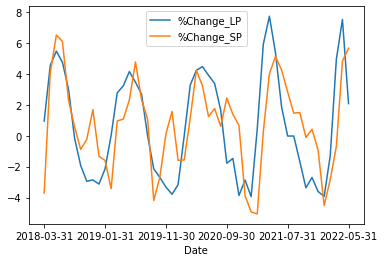

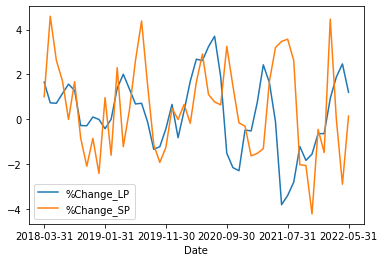

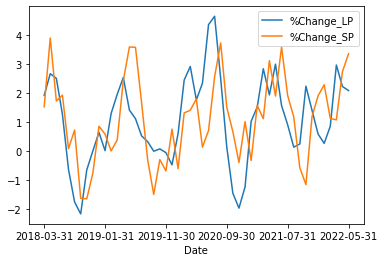

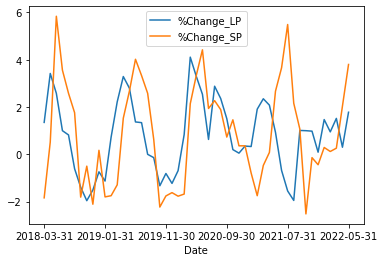

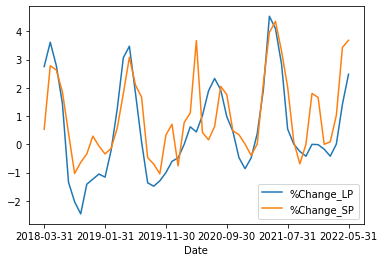

...

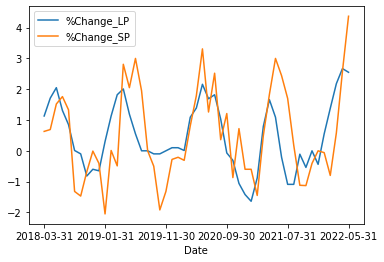

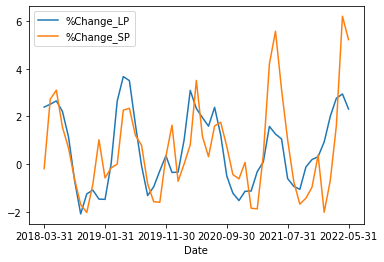

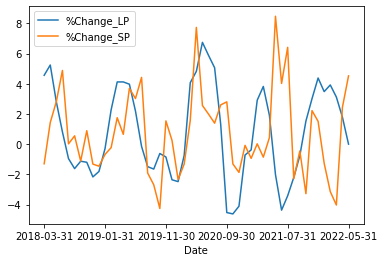

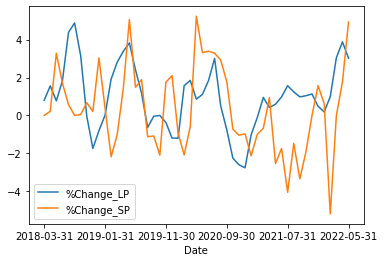

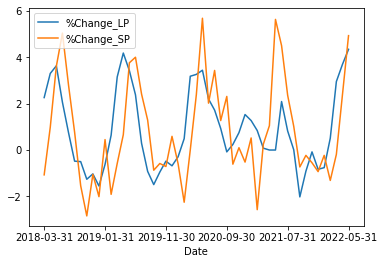

In [93]:
list_sale_data.groupby('City').plot(x='Date', y=['%Change_LP', '%Change_SP'])

In [94]:
# Merge for_sale_inventory and newListing_monthly dataframes
df = pd.merge(for_sale_Inv, newListing_monthly, how='left', on=['Date', 'City', 'State'])
df

,Date,City,State,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings
0,2018-03-31,New York,NY,1,72780.0,1.0,20163.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,2.0,9337.0
2,2018-03-31,Chicago,IL,3,44531.0,3.0,12642.0
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,4.0,9051.0
4,2018-03-31,Philadelphia,PA,5,26041.0,5.0,7043.0
...,...,...,...,...,...,...,...
47627,2022-06-30,Lamesa,TX,929,24.0,929.0,8.0
47628,2022-06-30,Craig,CO,930,61.0,930.0,29.0
47629,2022-06-30,Pecos,TX,931,25.0,931.0,6.0
47630,2022-06-30,Vernon,TX,932,21.0,932.0,7.0


In [95]:
# Drop rows with NaN values
forSaleInv_newList= df.dropna().reset_index(drop=True)
forSaleInv_newList

,Date,City,State,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings
0,2018-03-31,New York,NY,1,72780.0,1.0,20163.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,2.0,9337.0
2,2018-03-31,Chicago,IL,3,44531.0,3.0,12642.0
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,4.0,9051.0
4,2018-03-31,Philadelphia,PA,5,26041.0,5.0,7043.0
...,...,...,...,...,...,...,...
47263,2022-06-30,Lamesa,TX,929,24.0,929.0,8.0
47264,2022-06-30,Craig,CO,930,61.0,930.0,29.0
47265,2022-06-30,Pecos,TX,931,25.0,931.0,6.0
47266,2022-06-30,Vernon,TX,932,21.0,932.0,7.0


In [96]:
# Merge list_sale_data and newListing_monthly dataframes
df = pd.merge(forSaleInv_newList, list_sale_data, how='left', on=['Date', 'City', 'State'])
df

,Date,City,State,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...,...,...,...,...
47263,2022-06-30,Lamesa,TX,929,24.0,929.0,8.0,NaN,NaN,NaN,NaN
47264,2022-06-30,Craig,CO,930,61.0,930.0,29.0,NaN,NaN,NaN,NaN
47265,2022-06-30,Pecos,TX,931,25.0,931.0,6.0,NaN,NaN,NaN,NaN
47266,2022-06-30,Vernon,TX,932,21.0,932.0,7.0,NaN,NaN,NaN,NaN


In [97]:
# Drop rows with NaN values
forSale_data= df.dropna().reset_index(drop=True)
forSale_data

,Date,City,State,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,90,3400.0,90.0,1581.0,399800.0,2.64,334000.0,1.93
4790,2022-05-31,Des Moines,IA,91,2493.0,91.0,1028.0,357468.0,0.19,276483.0,3.49
4791,2022-05-31,Provo,UT,100,1212.0,100.0,751.0,684967.0,-0.25,538296.0,1.60
4792,2022-05-31,Durham,NC,104,1091.0,104.0,687.0,531667.0,1.60,433417.0,4.86


In [98]:
# Merge hvi_by_month and rent_data_by_month dataframes
df = pd.merge(hvi_data, rent_data, how='left', on=['Date', 'City', 'State'])
df

,Date,City,State,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...
29635,2022-06-30,Sweetwater,TX,94790.0,1.15,NaN,NaN
29636,2022-06-30,Andrews,TX,221347.0,1.44,NaN,NaN
29637,2022-06-30,Zapata,TX,117079.0,0.85,NaN,NaN
29638,2022-06-30,Vermillion,SD,231123.0,1.12,NaN,NaN


In [99]:
# Drop rows with NaN values
hvi_rent_data= df.dropna().reset_index(drop=True)
hvi_rent_data

,Date,City,State,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...
5039,2022-06-30,Killeen,TX,257621.0,2.03,1402.0,0.94
5040,2022-06-30,Fort Collins,CO,588269.0,1.10,1874.0,1.02
5041,2022-06-30,Boulder,CO,822361.0,0.24,2221.0,0.09
5042,2022-06-30,Gainesville,GA,378379.0,1.65,1652.0,1.54


In [100]:
# Merge forSale_data and hvi_rent_data dataframes
df = pd.merge(forSale_data, hvi_rent_data, how='left', on=['Date', 'City', 'State'])
df

,Date,City,State,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,90,3400.0,90.0,1581.0,399800.0,2.64,334000.0,1.93,349670.0,2.54,1883.0,1.24
4790,2022-05-31,Des Moines,IA,91,2493.0,91.0,1028.0,357468.0,0.19,276483.0,3.49,263210.0,0.82,1204.0,1.35
4791,2022-05-31,Provo,UT,100,1212.0,100.0,751.0,684967.0,-0.25,538296.0,1.60,592047.0,1.60,1759.0,1.74
4792,2022-05-31,Durham,NC,104,1091.0,104.0,687.0,531667.0,1.60,433417.0,4.86,426922.0,2.58,1669.0,1.95


In [101]:
housing_data = df.dropna().reset_index(drop=True)
housing_data

,Date,City,State,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4381,2022-05-31,Daytona Beach,FL,90,3400.0,90.0,1581.0,399800.0,2.64,334000.0,1.93,349670.0,2.54,1883.0,1.24
4382,2022-05-31,Des Moines,IA,91,2493.0,91.0,1028.0,357468.0,0.19,276483.0,3.49,263210.0,0.82,1204.0,1.35
4383,2022-05-31,Provo,UT,100,1212.0,100.0,751.0,684967.0,-0.25,538296.0,1.60,592047.0,1.60,1759.0,1.74
4384,2022-05-31,Durham,NC,104,1091.0,104.0,687.0,531667.0,1.60,433417.0,4.86,426922.0,2.58,1669.0,1.95


In [102]:
housing_data.describe()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
count,4386.000000,4386.000000,4386.000000,4386.000000,4.386000e+03,4386.000000,4.386000e+03,4386.000000,4.386000e+03,4386.000000,4386.000000,4386.000000
mean,47.988372,9608.630494,47.988372,3002.060437,3.767698e+05,0.709713,3.058491e+05,0.839455,3.120594e+05,0.854400,1509.942544,0.585394
std,30.188720,12156.042652,30.188720,3243.011128,1.620632e+05,1.997620,1.407625e+05,1.847382,1.709778e+05,0.735286,442.294513,0.844734
min,1.000000,278.000000,1.000000,132.000000,1.299670e+05,-6.010000,1.084850e+05,-8.730000,1.159270e+05,-0.900000,906.000000,-4.410000
25%,22.000000,2991.000000,22.000000,983.000000,2.741968e+05,-0.610000,2.131775e+05,-0.310000,2.058695e+05,0.330000,1202.000000,0.080000
50%,47.500000,5418.500000,47.500000,1723.000000,3.340500e+05,0.520000,2.685665e+05,0.730000,2.632970e+05,0.650000,1388.000000,0.480000
75%,70.000000,11207.750000,70.000000,3655.000000,4.235715e+05,1.930000,3.539582e+05,1.930000,3.634722e+05,1.230000,1665.000000,0.960000
max,159.000000,97032.000000,159.000000,25402.000000,1.022798e+06,29.570000,1.162167e+06,24.790000,1.494103e+06,5.330000,3247.000000,10.640000


In [103]:
#output_path = 'Resources/housing_data.csv'
#housing_data.to_csv(output_path, index=False)

In [104]:
hvi_rent_data.hvplot.scatter(x='%Change_HVI', y='%Change_Rent')

:Scatter   [%Change_HVI]   (%Change_Rent)

<AxesSubplot:xlabel='City'>

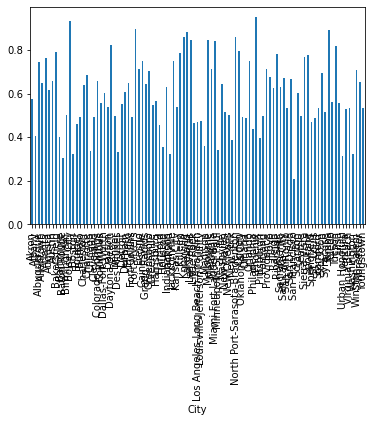

In [105]:
hvi_rent_data.groupby('City')['%Change_Rent'].mean().plot(kind='bar')


City
Akron             AxesSubplot(0.125,0.125;0.775x0.755)
Albany            AxesSubplot(0.125,0.125;0.775x0.755)
Albuquerque       AxesSubplot(0.125,0.125;0.775x0.755)
Allentown         AxesSubplot(0.125,0.125;0.775x0.755)
Atlanta           AxesSubplot(0.125,0.125;0.775x0.755)
                                  ...                 
Virginia Beach    AxesSubplot(0.125,0.125;0.775x0.755)
Washington        AxesSubplot(0.125,0.125;0.775x0.755)
Winston-Salem     AxesSubplot(0.125,0.125;0.775x0.755)
Worcester         AxesSubplot(0.125,0.125;0.775x0.755)
Youngstown        AxesSubplot(0.125,0.125;0.775x0.755)
Length: 97, dtype: object

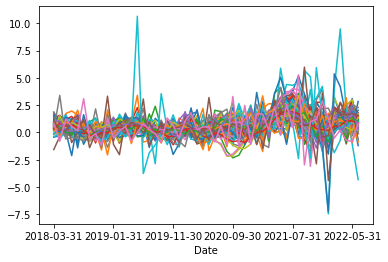

In [106]:
fig, ax = plt.subplots()
hvi_rent_data.groupby('City').plot(x='Date', y='%Change_Rent', ax=ax, legend=False)

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\pandas\plotting\_matplotlib\core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


City
Akron             AxesSubplot(0.125,0.125;0.775x0.755)
Albany            AxesSubplot(0.125,0.125;0.775x0.755)
Albuquerque       AxesSubplot(0.125,0.125;0.775x0.755)
Allentown         AxesSubplot(0.125,0.125;0.775x0.755)
Atlanta           AxesSubplot(0.125,0.125;0.775x0.755)
                                  ...                 
Virginia Beach    AxesSubplot(0.125,0.125;0.775x0.755)
Washington        AxesSubplot(0.125,0.125;0.775x0.755)
Winston-Salem     AxesSubplot(0.125,0.125;0.775x0.755)
Worcester         AxesSubplot(0.125,0.125;0.775x0.755)
Youngstown        AxesSubplot(0.125,0.125;0.775x0.755)
Length: 97, dtype: object

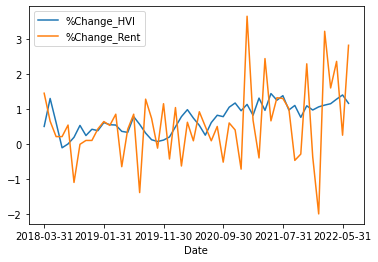

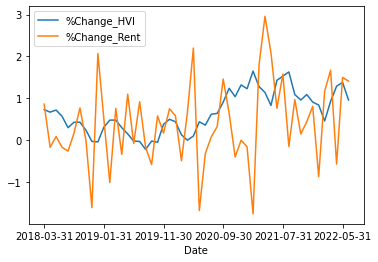

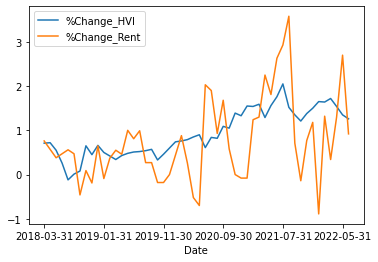

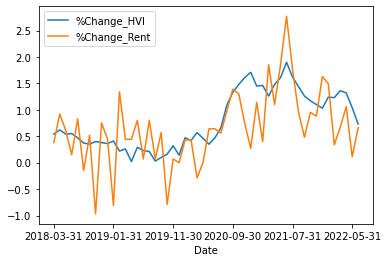

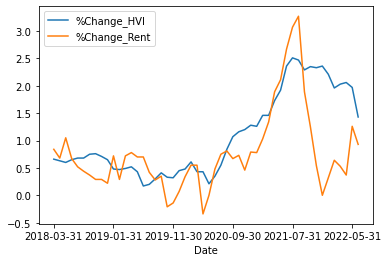

...

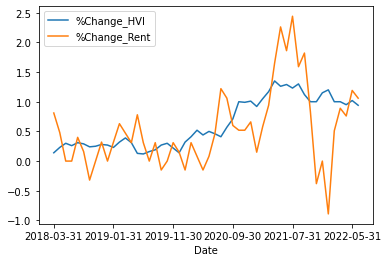

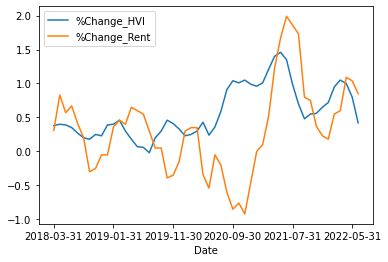

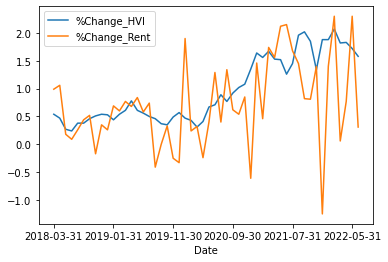

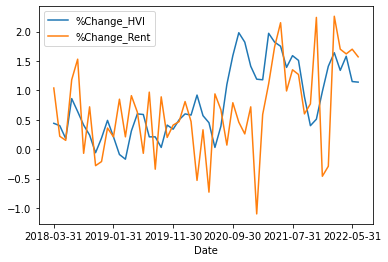

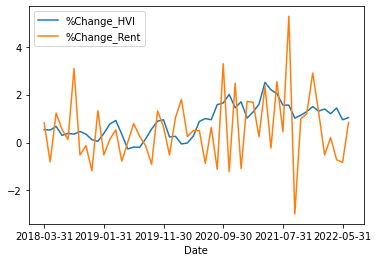

In [107]:
hvi_rent_data.groupby('City').plot(x='Date', y=['%Change_HVI', '%Change_Rent'])

## Machine Learning Tests


In [108]:
# Drop Date, City, State columns for machine learning dataframe
ml_cluster = housing_data.drop(columns=['Date', 'City', 'State'])
ml_cluster.head()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74


In [109]:
# Test unsupervised machine learning model
from sklearn.cluster import KMeans

# Initialize instance of model
model = KMeans(n_clusters=2, random_state=5)

# Fit model
model.fit(ml_cluster)

# Get the predictions
predictions = model.predict(ml_cluster)
print(predictions)


[1 1 0 ... 1 1 1]


In [110]:
# Add class column to dataframe with predictions
ml_cluster['Class'] = model.labels_
ml_cluster.head()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent,Class
0,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38,1
1,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35,1
2,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79,0
3,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22,0
4,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74,0


In [111]:
# Create a scatter plot of ml_hvi_rent
ml_cluster.hvplot.scatter(x='%Change_HVI', y='%Change_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [%Change_HVI]   (%Change_Rent)

In [112]:
# Scale data and fit to model
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, mean_squared_error, r2_score, mean_absolute_error

X_scaled = StandardScaler().fit_transform(ml_cluster)
X_scaled

array([[-1.55666519,  5.19729768, -1.55666519, ...,  2.51231725,
        -0.24317448,  2.13187239],
       [-1.52353646,  1.00129273, -1.52353646, ...,  1.83169764,
        -0.27869265,  2.13187239],
       [-1.49040773,  2.87316788, -1.49040773, ...,  0.31443598,
         0.24224051, -0.46907123],
       ...,
       [ 1.72307929, -0.69081593,  1.72307929, ...,  0.5631674 ,
         1.36698256,  2.13187239],
       [ 1.85559422, -0.70077096,  1.85559422, ...,  0.35965988,
         1.61560975,  2.13187239],
       [ 3.67767448, -0.66975404,  3.67767448, ...,  0.7802421 ,
         1.24858866,  2.13187239]])

In [113]:
# Initialize instance of model
model = KMeans(n_clusters=2, random_state=5)

model.fit(X_scaled)
predictions = model.predict(X_scaled)
print(predictions)

[1 1 0 ... 1 1 1]


In [114]:
ml_cluster['Class'] = model.labels_
ml_cluster.head()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent,Class
0,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38,1
1,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35,1
2,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79,0
3,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22,0
4,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74,0


In [115]:
# Create a scatter plot of ml_hvi_rent
ml_cluster.hvplot.scatter(x='%Change_HVI', y='%Change_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [%Change_HVI]   (%Change_Rent)

In [116]:
# Create an elbow curve to find the best value for K.
inertia = []
k = list(range(1, 11))

for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(X_scaled)
    inertia.append(km.inertia_)
    
# Define DataFrame and plot the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks=k)

:Curve   [k]   (inertia)

In [117]:
# Initialize the K-Means model.
model = KMeans(n_clusters=3, random_state=1)

# Fit the model
model.fit(X_scaled)

# Predict clusters
predictions = model.predict(X_scaled)
predictions

array([2, 1, 2, ..., 1, 1, 1])

In [118]:
ml_cluster['Class'] = model.labels_
ml_cluster.head()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent,Class
0,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38,2
1,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35,1
2,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79,2
3,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22,2
4,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74,2


In [119]:
# Create a scatter plot of ml_hvi_rent
ml_cluster.hvplot.scatter(x='%Change_HVI', y='%Change_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [%Change_HVI]   (%Change_Rent)

In [120]:
from sklearn.linear_model import LinearRegression

In [121]:
ml_data = housing_data.drop(columns=['Date', 'City', 'State'])
ml_data.head()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,1,72780.0,1.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2,21779.0,2.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,3,44531.0,3.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,4,24332.0,4.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,5,26041.0,5.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74


In [122]:
ml_data.shape

(4386, 12)

In [123]:
# Define Features set
X = ml_data.copy()
X = X.drop('%Change_Rent', axis=1)
X.head()

# Define Target Set
y = ml_data['%Change_Rent'].values.reshape(-1, 1)
y.shape

(4386, 1)

In [124]:
# Split into testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3289, 11)
(1097, 11)
(3289, 1)
(1097, 1)


In [125]:
# Creating a StandardScaler instance.
scaler = StandardScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [126]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

R2 Score: 0.30037242305140444


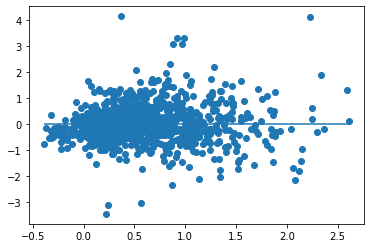

In [127]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)
# Plot Residuals
plt.scatter(predictions, predictions - y_test)
plt.hlines(y=0, xmin=predictions.min(), xmax=predictions.max())
plt.show()

In [128]:
ml_data = housing_data.drop(columns=['Date', 'City', 'State', '%Change_LP', '%Change_SP', '%Change_HVI', '%Change_Rent'])
ml_data.head()

,SizeRank_x,ForSale_Inv,SizeRank_y,New_Listings,Avg_List_Price,Avg_Sale_Price,HVI,Avg_Rent
0,1,72780.0,1.0,20163.0,534333.0,399667.0,463521.0,2621.0
1,2,21779.0,2.0,9337.0,821000.0,622667.0,650554.0,2320.0
2,3,44531.0,3.0,12642.0,319467.0,225667.0,236447.0,1649.0
3,4,24332.0,4.0,9051.0,351633.0,255667.0,241512.0,1340.0
4,5,26041.0,5.0,7043.0,253667.0,224000.0,236999.0,1489.0


In [129]:
# Define Features set
X = ml_data.copy()
X = X.drop('Avg_Rent', axis=1)


# Define Target Set
y = ml_data['Avg_Rent'].values
print(X.shape, y.shape)

(4386, 7) (4386,)


In [130]:
# Split into testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3289, 7)
(1097, 7)
(3289,)
(1097,)


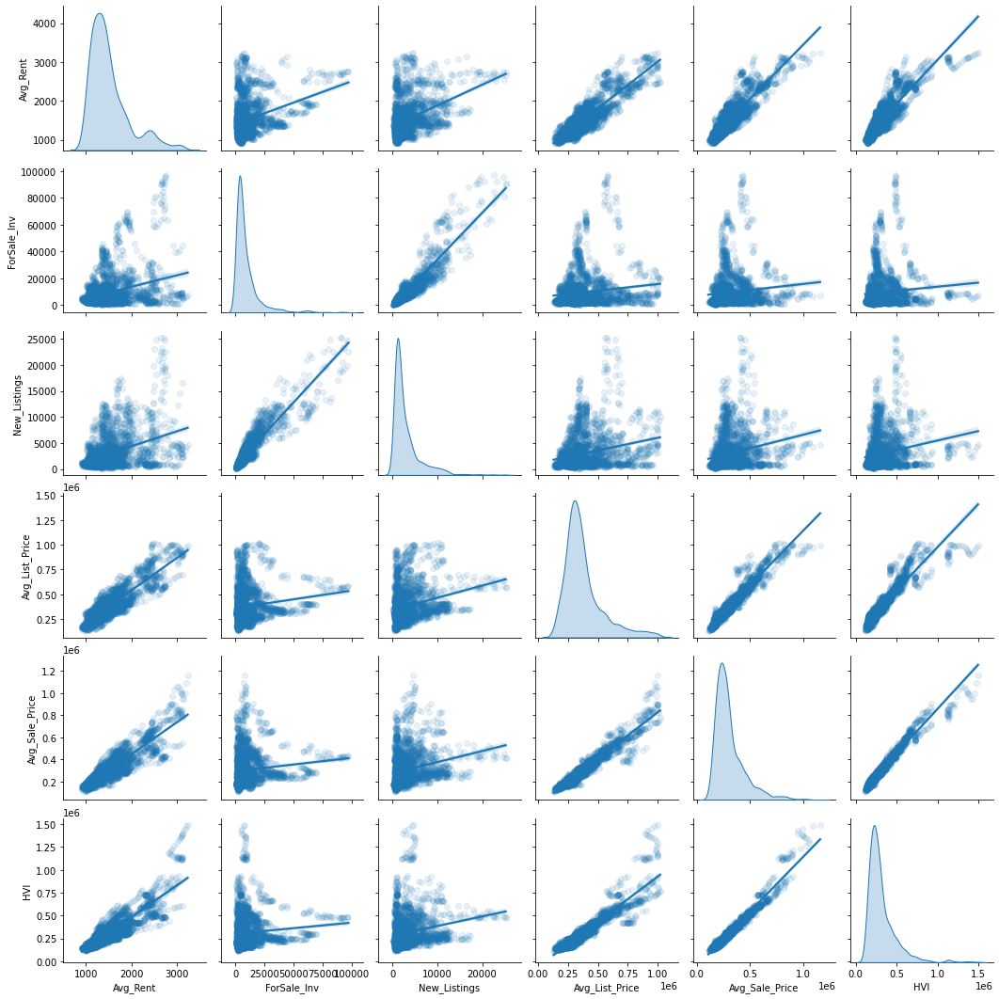

In [131]:
import seaborn as sns

train_dataset = X_train.copy()
train_dataset.insert(0, "Avg_Rent", y_train)
_ = sns.pairplot(
    train_dataset[['Avg_Rent', 'ForSale_Inv', 'New_Listings', 'Avg_List_Price', 'Avg_Sale_Price', 'HVI']],
    kind='reg', diag_kind='kde', plot_kws={'scatter_kws': {'alpha': 0.1}})

In [132]:
from sklearn.linear_model import RidgeCV

model = RidgeCV()

model.fit(X_train, y_train)

print(f'model score on training data: {model.score(X_train, y_train)}')
print(f'model score on testing data: {model.score(X_test, y_test)}')

model score on training data: 0.8553333445943676
model score on testing data: 0.8477220037970852


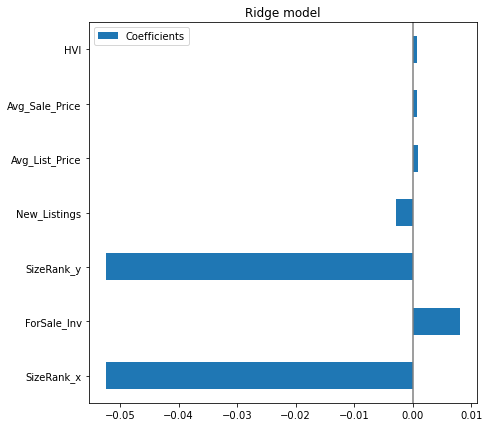

In [133]:
coefs = pd.DataFrame(
   model.coef_,
   columns=['Coefficients'], index=X_train.columns
)

coefs.plot(kind='barh', figsize=(9, 7))
plt.title('Ridge model')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)

(0.0, 100.0)

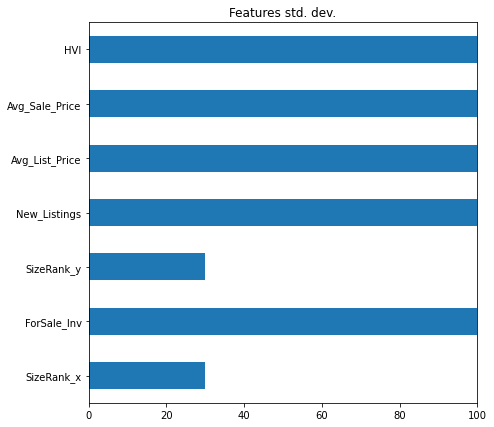

In [134]:
X_train.std(axis=0).plot(kind='barh', figsize=(9, 7))
plt.title('Features std. dev.')
plt.subplots_adjust(left=.3)
plt.xlim((0, 100))

In [135]:
from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(), RidgeCV())

model.fit(X_train, y_train)

print(f'model score on training data: {model.score(X_train, y_train)}')
print(f'model score on testing data: {model.score(X_test, y_test)}')

model score on training data: 0.85532736196663
model score on testing data: 0.8476746289881532


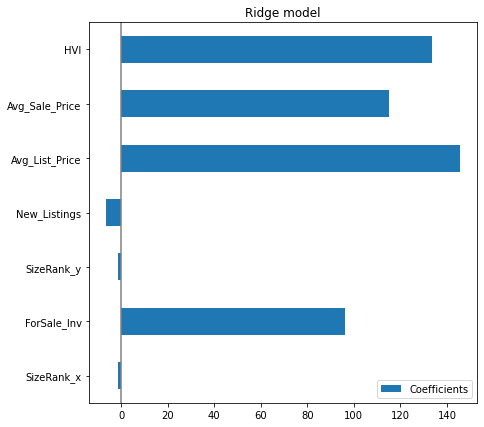

In [136]:
coefs = pd.DataFrame(
   model[1].coef_,
   columns=['Coefficients'], index=X_train.columns
)

coefs.plot(kind='barh', figsize=(9, 7))
plt.title('Ridge model')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)

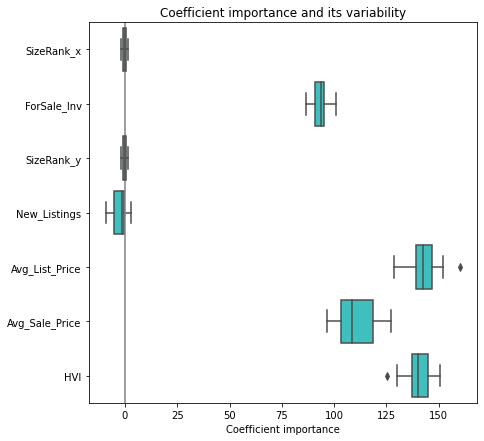

In [137]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedKFold

cv_model = cross_validate(
   model, X, y, cv=RepeatedKFold(n_splits=5, n_repeats=5),
   return_estimator=True, n_jobs=2
)
coefs = pd.DataFrame(
   [model[1].coef_
    for model in cv_model['estimator']],
   columns=X.columns
)
plt.figure(figsize=(9, 7))
sns.boxplot(data=coefs, orient='h', color='cyan', saturation=0.5)
plt.axvline(x=0, color='.5')
plt.xlabel('Coefficient importance')
plt.title('Coefficient importance and its variability')
plt.subplots_adjust(left=.3)

In [138]:
# Define Features set
X = ml_data.copy()
X = X.drop('Avg_Rent', axis=1)


# Define Target Set
y = ml_data['Avg_Rent'].values
print(X.shape, y.shape)

(4386, 7) (4386,)


In [139]:
# Split into testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3289, 7)
(1097, 7)
(3289,)
(1097,)


In [140]:
# Creating a StandardScaler instance.
scaler = StandardScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [141]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

R2 Score: 0.8553333681430376


In [142]:
import statsmodels.api as sma
# Run StatsModel 
X2 = sma.add_constant(X_train_scaled)
est = sma.OLS(y_train, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.855
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     3234.
Date:                Tue, 23 Aug 2022   Prob (F-statistic):               0.00
Time:                        23:37:33   Log-Likelihood:                -21524.
No. Observations:                3289   AIC:                         4.306e+04
Df Residuals:                    3282   BIC:                         4.310e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1510.3405      2.936    514.393      0.0

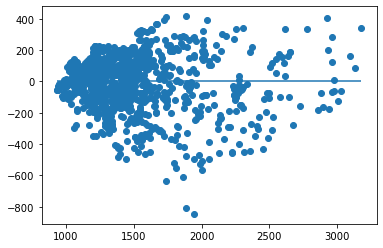

In [143]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)
# Plot Residuals
plt.scatter(predictions, predictions - y_test)
plt.hlines(y=0, xmin=predictions.min(), xmax=predictions.max())
plt.show()

In [144]:
# Calculate Mean Squared Error and R2
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"mean squared error (MSE): {mse}")
print(f"R-squared (R2 ): {r2}")

mean squared error (MSE): 29783.118874135704
R-squared (R2 ): 0.8477115979406824


In [145]:
print(model.intercept_)

print(model.coef_)


1510.3405290361811
[ -1.57372149  98.56664251  -1.57372149  -8.92500318 146.87233998
 113.34827007 134.91248084]


In [146]:
print(mean_absolute_error(y_test, predictions))
print(mean_squared_error(y_test, predictions))
print(np.sqrt(mean_squared_error(y_test, predictions)))

132.61506336122133
29783.118874135704
172.57786322160703


In [147]:
# Define Features set
X = ml_data.copy()
X = X.drop(columns=['New_Listings', 'Avg_Rent'], axis=1)


# Define Target Set
y = ml_data['Avg_Rent'].values
print(X.shape, y.shape)

(4386, 6) (4386,)


In [148]:
# Split into testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3289, 6)
(1097, 6)
(3289,)
(1097,)


In [149]:
# Creating a StandardScaler instance.
scaler = StandardScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [150]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

R2 Score: 0.8552902623326049


In [151]:
import statsmodels.api as sma
# Run StatsModel 
X2 = sma.add_constant(X_train_scaled)
est = sma.OLS(y_train, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.855
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     3881.
Date:                Tue, 23 Aug 2022   Prob (F-statistic):               0.00
Time:                        23:37:33   Log-Likelihood:                -21524.
No. Observations:                3289   AIC:                         4.306e+04
Df Residuals:                    3283   BIC:                         4.310e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1510.3405      2.936    514.395      0.0

In [152]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)

In [153]:
print(mean_absolute_error(y_test, predictions))
print(mean_squared_error(y_test, predictions))
print(np.sqrt(mean_squared_error(y_test, predictions)))
print(r2_score(y_test, predictions))

132.58223388810782
29758.975887897468
172.50790094339874
0.8478350469592589
